In [3]:
#!pip install numpy==1.24.4 pandas==1.5.3


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from sklearn.preprocessing import LabelEncoder,RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.svm import SVC
import cv2
#import mediapipe as mp
import joblib

In [5]:
#load data
data=pd.read_csv('hand_landmarks_data.csv')
data

,x1,y1,z1,x2,y2,z2,x3,y3,z3,x4,...,x19,y19,z19,x20,y20,z20,x21,y21,z21,label
0,262.669968,257.304901,-3.649205e-07,257.417542,247.109055,0.004224,246.882957,241.716827,0.005798,236.384537,...,223.345093,255.490692,-0.020450,215.043365,258.114746,-0.024577,208.006393,259.608673,-0.026722,call
1,83.351778,346.059113,-2.345265e-07,81.925037,328.562347,-0.011102,90.080132,311.535248,-0.021096,95.641823,...,132.451618,341.794434,-0.038175,142.773582,342.829254,-0.037336,152.431698,343.015991,-0.036136,call
2,187.756977,260.235492,-2.417307e-07,195.460579,241.506035,-0.000184,207.259529,223.674339,-0.009687,215.413628,...,250.301010,268.602938,-0.044068,262.425133,271.276638,-0.040469,272.989952,272.272231,-0.038301,call
3,114.976696,331.594238,-1.233261e-07,114.503494,320.549957,-0.002824,116.636627,310.080994,-0.008911,117.685066,...,145.195450,329.357544,-0.027622,151.053200,329.712341,-0.027863,155.990364,329.548828,-0.027723,call
4,188.795288,141.727867,-1.622995e-07,188.520905,127.947464,-0.002884,191.982880,111.010563,-0.008115,192.552521,...,226.696396,132.263248,-0.025113,234.831741,130.684147,-0.024087,241.587769,128.477188,-0.023486,call
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25670,259.135620,277.542236,4.323656e-07,271.098221,257.333374,0.007132,269.350250,237.538345,0.004480,257.334503,...,231.102150,230.308350,-0.028861,235.017242,235.029312,-0.016911,237.608711,240.918411,-0.006697,two_up_inverted
25671,90.063995,256.181732,3.808555e-07,77.302231,237.829132,0.003778,78.658888,220.471680,-0.001519,89.374163,...,116.692326,210.932007,-0.043690,112.681984,215.274353,-0.029510,110.178349,221.338379,-0.015630,two_up_inverted
25672,236.724518,251.496756,5.912488e-07,254.918358,232.369956,0.001354,256.002502,209.969106,-0.001674,247.075447,...,211.933777,202.389975,-0.031740,215.493393,208.953272,-0.021970,218.057648,215.236920,-0.010803,two_up_inverted
25673,119.466957,309.842529,4.319564e-07,111.772064,291.310333,0.006174,116.895447,273.683929,0.001893,129.239788,...,157.217422,271.056702,-0.046297,154.780106,277.261139,-0.032800,150.117119,282.011047,-0.020277,two_up_inverted


In [6]:
#check nulls
data.isna().sum().sort_values(ascending=False)

,0
x1,0
y1,0
y12,0
z12,0
x13,0
...,...
z9,0
x10,0
y10,0
z10,0


In [7]:
# show some statistics about numerical data
data.describe()

,x1,y1,z1,x2,y2,z2,x3,y3,z3,x4,...,z18,x19,y19,z19,x20,y20,z20,x21,y21,z21
count,25675.000000,25675.000000,2.567500e+04,25675.000000,25675.000000,25675.000000,25675.000000,25675.000000,25675.000000,25675.000000,...,25675.000000,25675.000000,25675.000000,25675.000000,25675.000000,25675.000000,25675.000000,25675.000000,25675.000000,25675.000000
mean,201.958632,260.158527,1.272461e-07,202.517395,252.115322,-0.009465,202.862981,240.645966,-0.015946,203.025267,...,-0.024129,201.792374,227.455597,-0.033751,201.811275,227.802576,-0.032208,201.874802,227.807287,-0.028828
std,90.500333,76.533210,2.737932e-07,84.770933,75.384691,0.010376,80.412089,74.721921,0.013973,79.647588,...,0.015658,94.046497,77.231210,0.020453,93.664595,78.441253,0.020877,93.547017,79.963438,0.021136
min,-36.050926,45.722923,-2.029986e-06,7.184681,51.256840,-0.096630,25.114323,45.489950,-0.155846,23.446341,...,-0.201897,0.198635,20.146784,-0.286821,3.278137,32.158108,-0.286470,-4.537216,23.226204,-0.262047
25%,124.110329,205.815950,-5.243216e-08,130.535929,197.999625,-0.015199,136.711035,187.018583,-0.023020,138.905817,...,-0.030728,126.828913,172.720392,-0.042726,126.887403,172.345467,-0.041957,126.356627,172.083794,-0.039220
50%,199.667847,255.181793,1.497277e-07,199.979530,247.113892,-0.008737,200.092758,235.776978,-0.014231,200.482040,...,-0.020969,197.579865,221.781479,-0.029942,197.591736,222.381149,-0.028510,197.453270,222.485229,-0.025269
75%,266.428482,304.991663,2.989988e-07,261.147457,296.850769,-0.002783,255.876354,284.925993,-0.007134,254.622768,...,-0.013661,268.103920,273.190765,-0.019987,267.745743,274.196884,-0.017971,267.324657,275.805222,-0.014294
max,633.556020,781.674469,1.876254e-06,606.232386,751.869416,0.076365,598.541348,719.365010,0.094131,607.999801,...,0.031774,632.923029,779.419948,0.078105,638.134761,760.854103,0.104580,641.788521,760.554894,0.118668


In [8]:
# show datatype for each column
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25675 entries, 0 to 25674
Data columns (total 64 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x1      25675 non-null  float64
 1   y1      25675 non-null  float64
 2   z1      25675 non-null  float64
 3   x2      25675 non-null  float64
 4   y2      25675 non-null  float64
 5   z2      25675 non-null  float64
 6   x3      25675 non-null  float64
 7   y3      25675 non-null  float64
 8   z3      25675 non-null  float64
 9   x4      25675 non-null  float64
 10  y4      25675 non-null  float64
 11  z4      25675 non-null  float64
 12  x5      25675 non-null  float64
 13  y5      25675 non-null  float64
 14  z5      25675 non-null  float64
 15  x6      25675 non-null  float64
 16  y6      25675 non-null  float64
 17  z6      25675 non-null  float64
 18  x7      25675 non-null  float64
 19  y7      25675 non-null  float64
 20  z7      25675 non-null  float64
 21  x8      25675 non-null  float64
 22

In [9]:
# check duplicates
data[data.duplicated()]

,x1,y1,z1,x2,y2,z2,x3,y3,z3,x4,...,x19,y19,z19,x20,y20,z20,x21,y21,z21,label


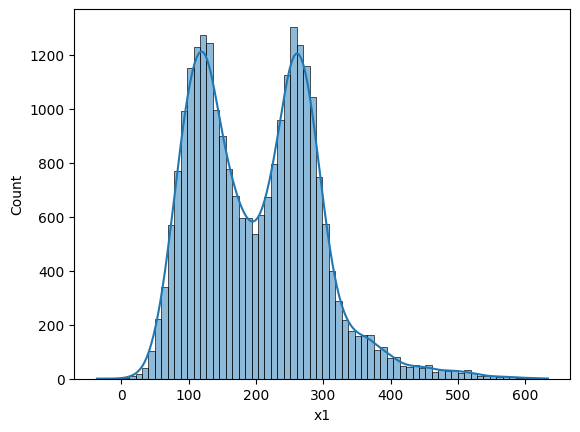

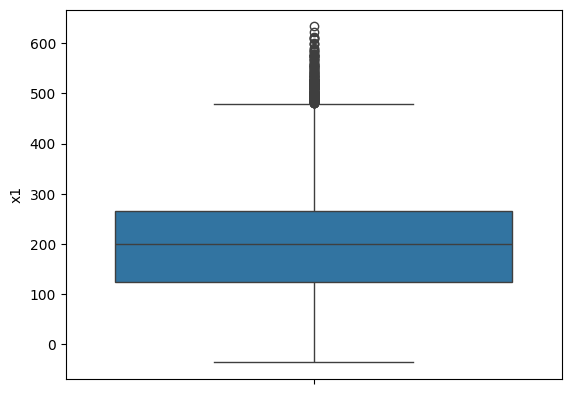

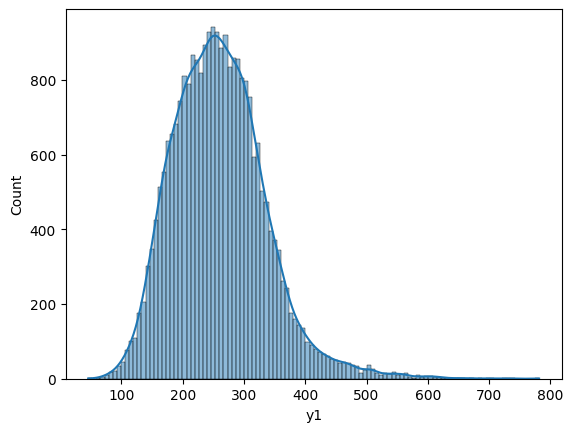

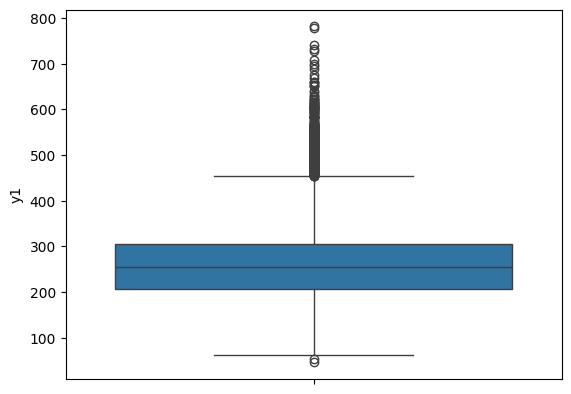

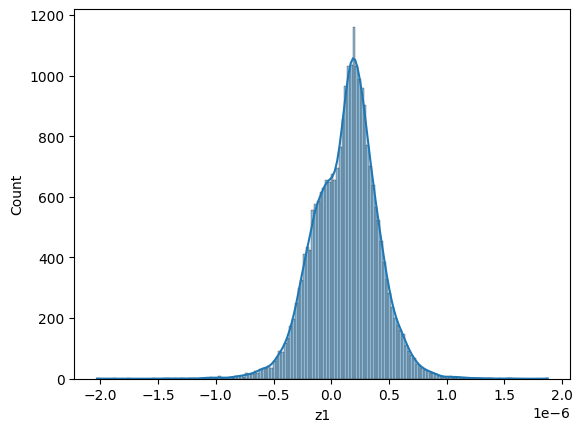

...

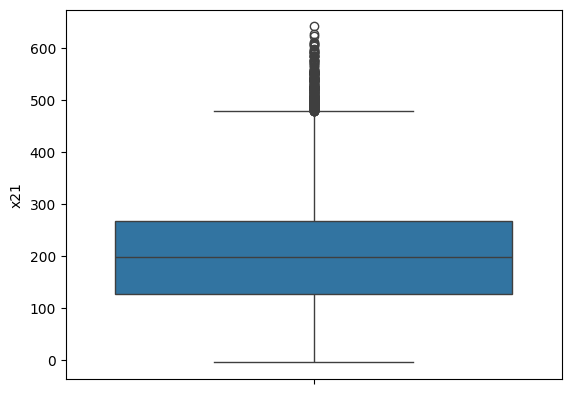

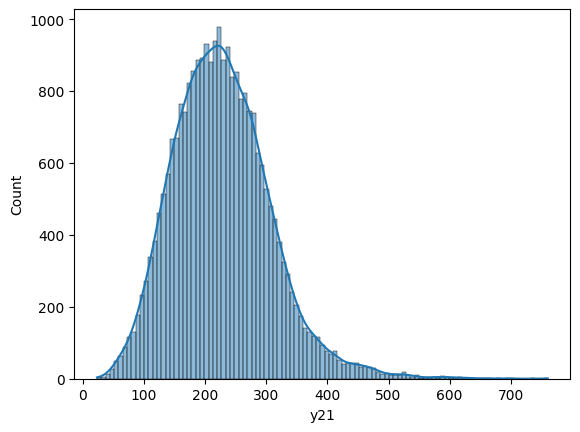

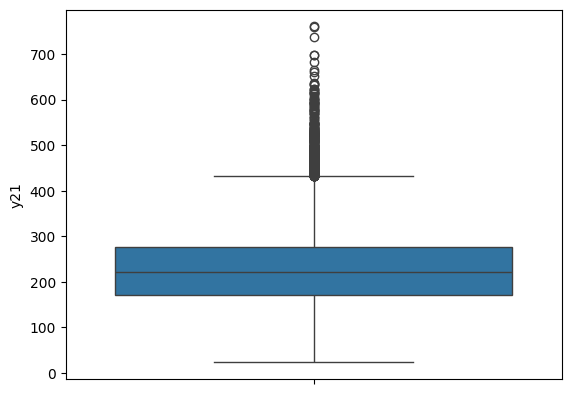

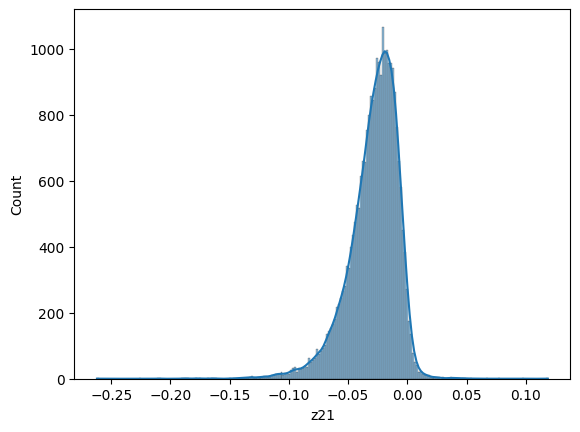

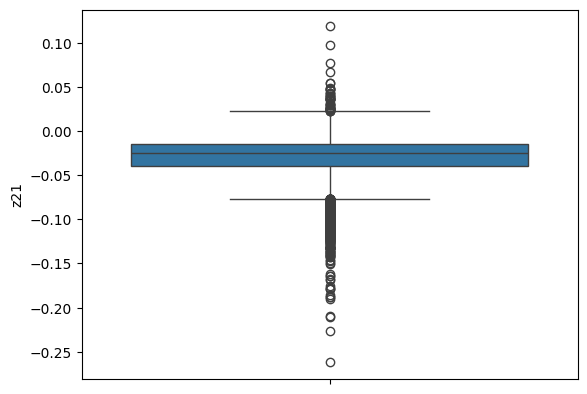

In [10]:
#visualization
# Univariate
for col in data.select_dtypes('float64').columns:
  sns.histplot(data=data,x=col,kde=True)
  plt.show()
  sns.boxplot(data=data,y=col)
  plt.show()


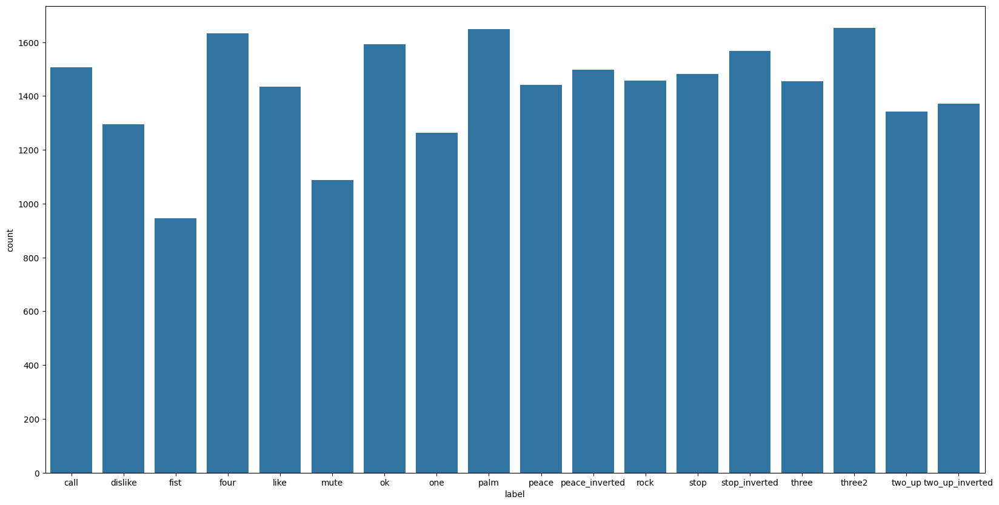

'\ncounts of (four, palm, three2) is more than other labels\n'

In [11]:
plt.figure(figsize=(20,10))
sns.countplot(data,x='label')
plt.show()
'''
counts of (four, palm, three2) is more than other labels
'''

In [12]:
def plot3D(x,y,z):
  l=LabelEncoder()
  label_encode=l.fit_transform(data['label'])
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))
  colors=cmap(label_encode)
  fig = plt.figure(figsize=(20,10))
  ax = plt.axes(projection ='3d')
  ax.scatter3D(x,y,z,c=colors)
  ax.set_title('relationship')
  from matplotlib.lines import Line2D
  legend_elements = [Line2D([0], [0], marker='o', color='w', label=cat,
                            markerfacecolor=cmap(l.transform([cat])[0]), markersize=10)
                    for cat in l.classes_]
  ax.legend(handles=legend_elements, title="hand gestures")
  ax.set_xlabel('x')
  ax.set_ylabel('y')
  ax.set_zlabel('z')
  plt.show()

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


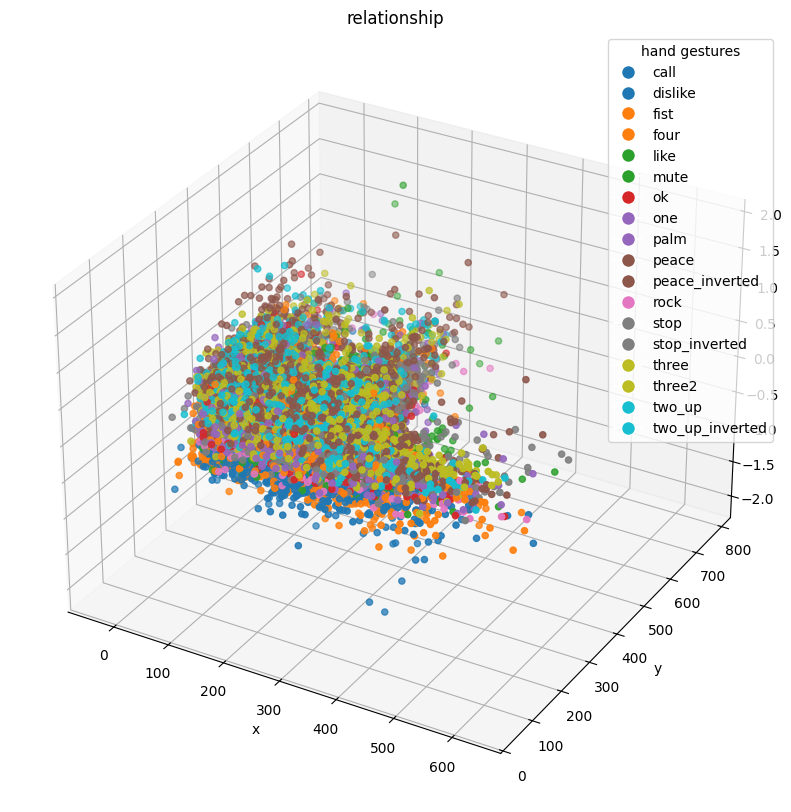

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


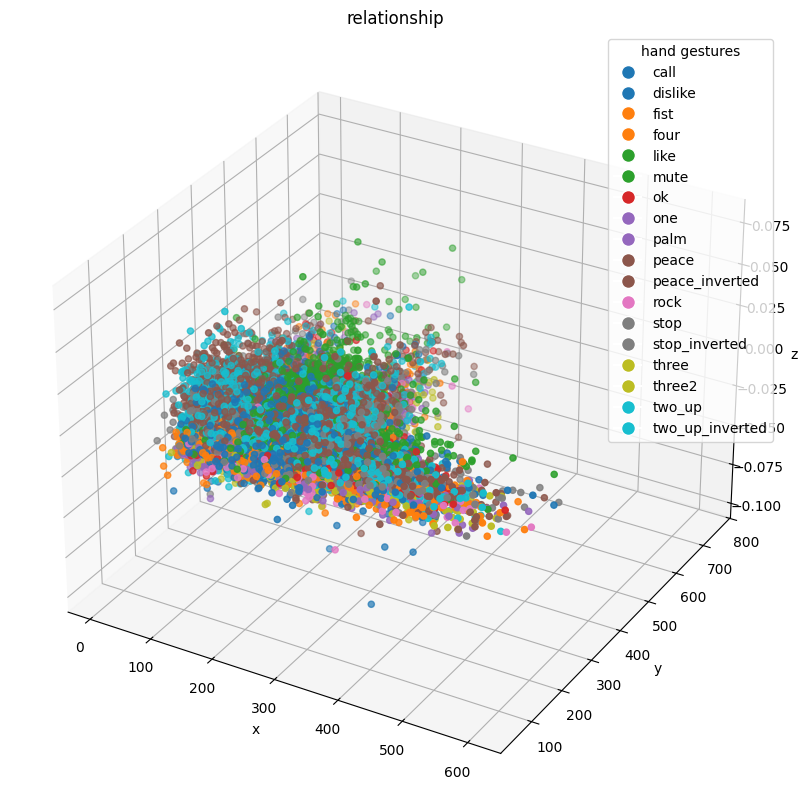

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


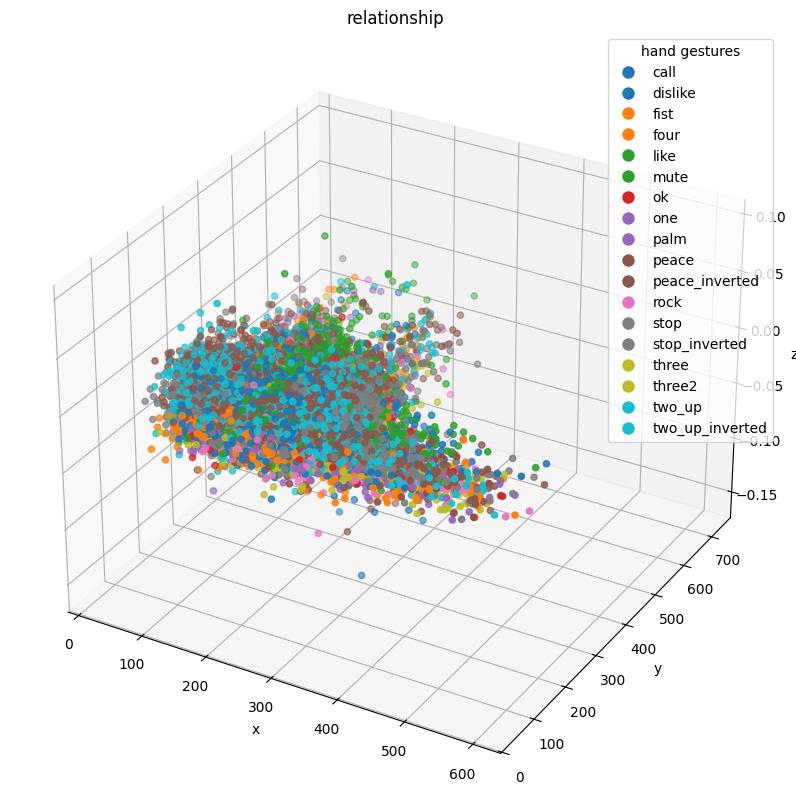

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


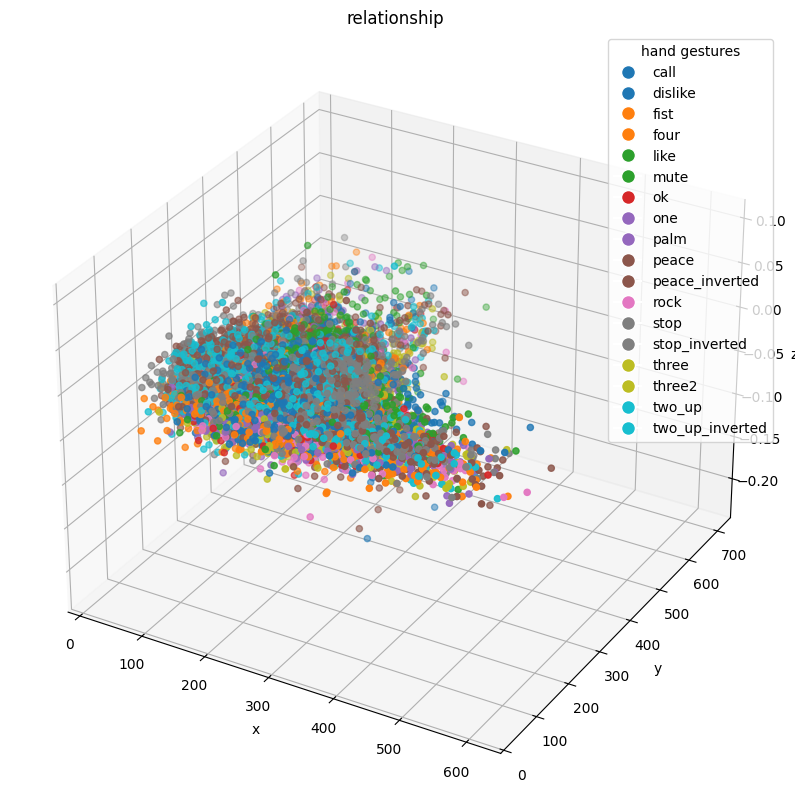

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


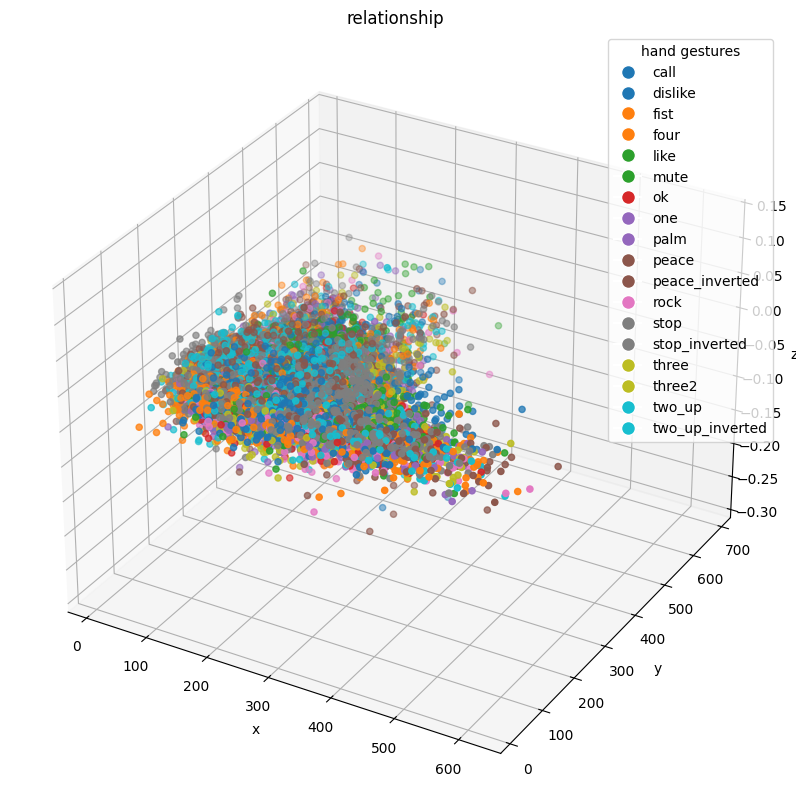

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


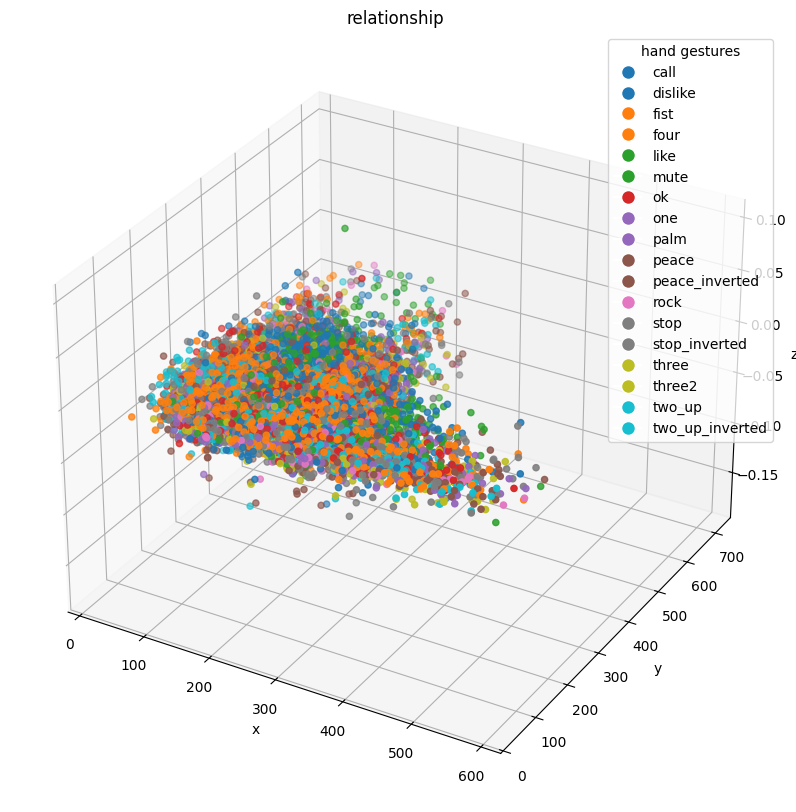

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


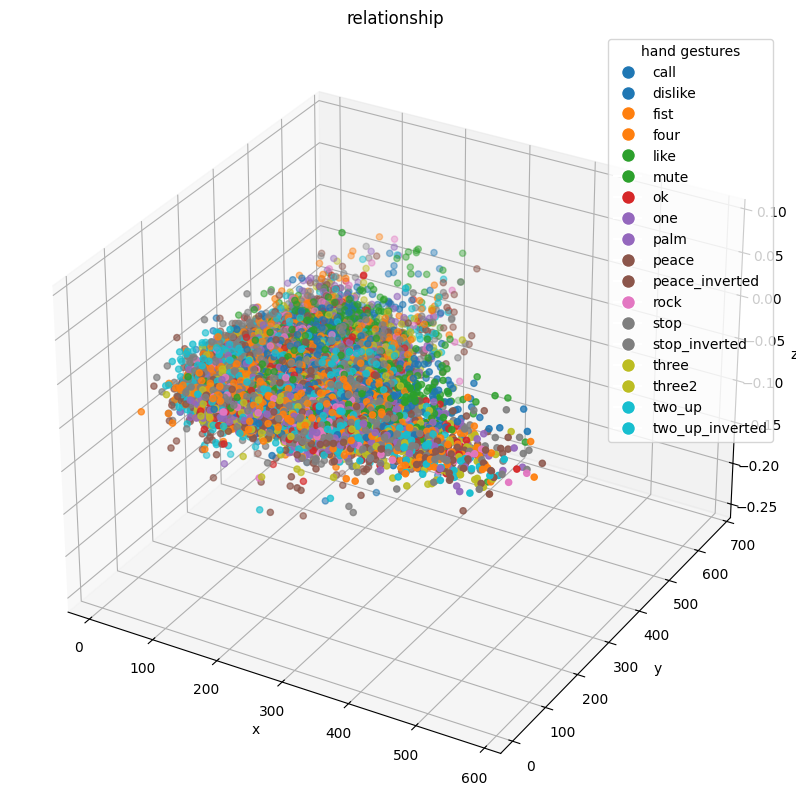

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


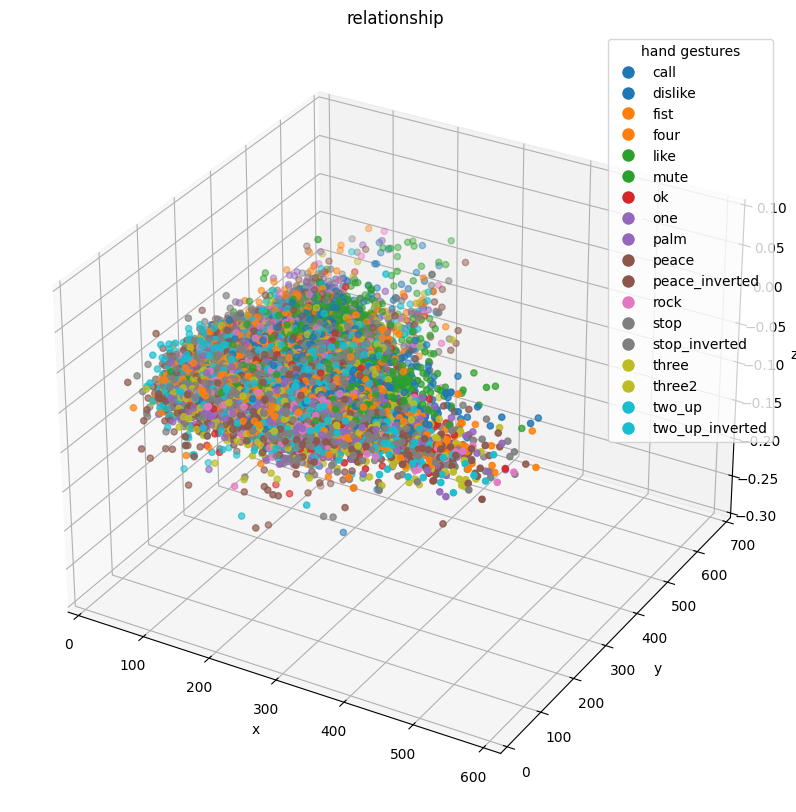

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


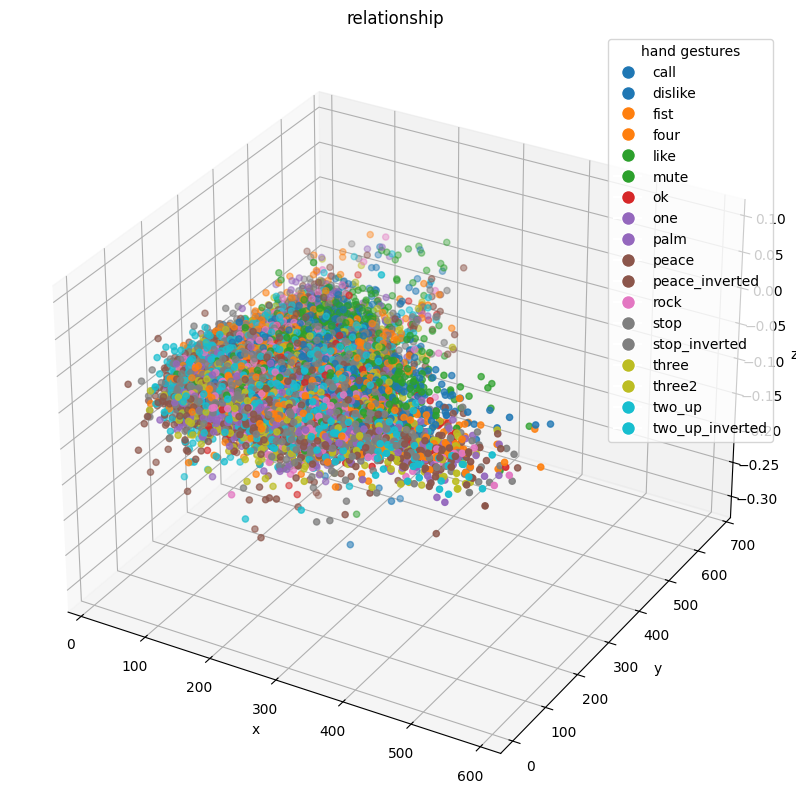

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


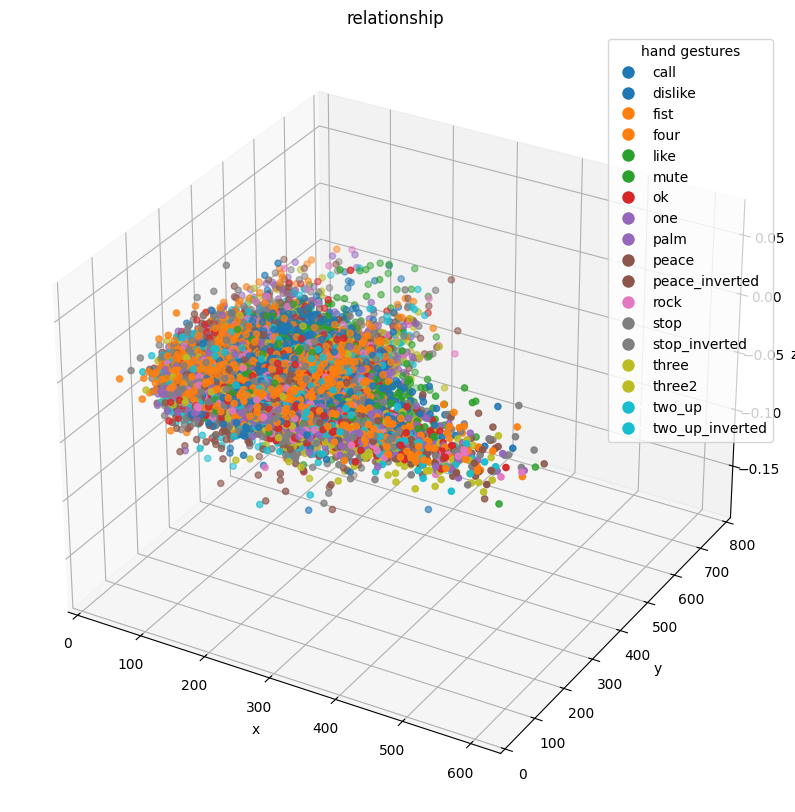

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


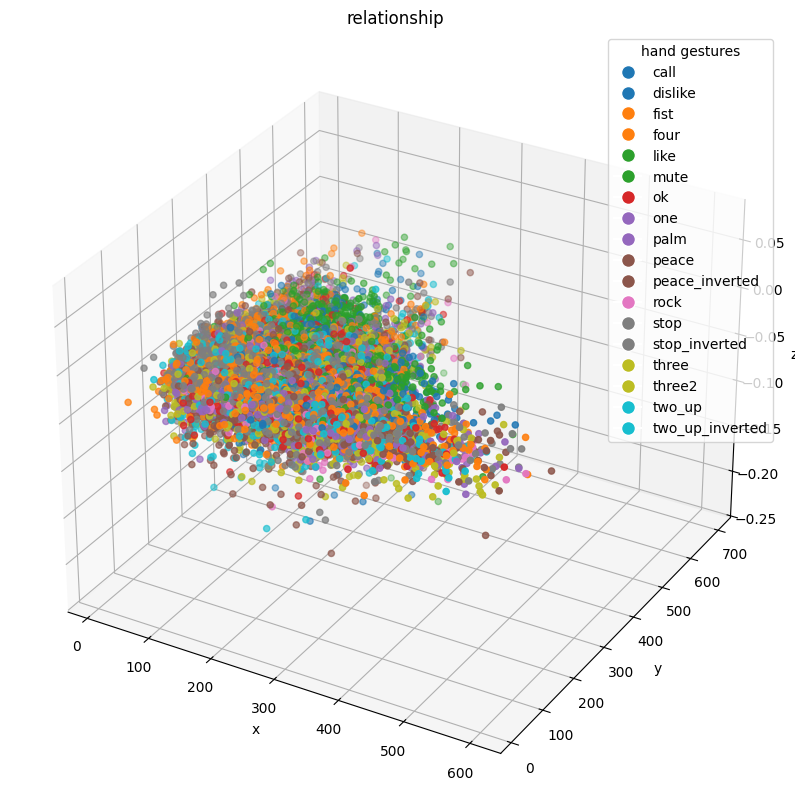

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


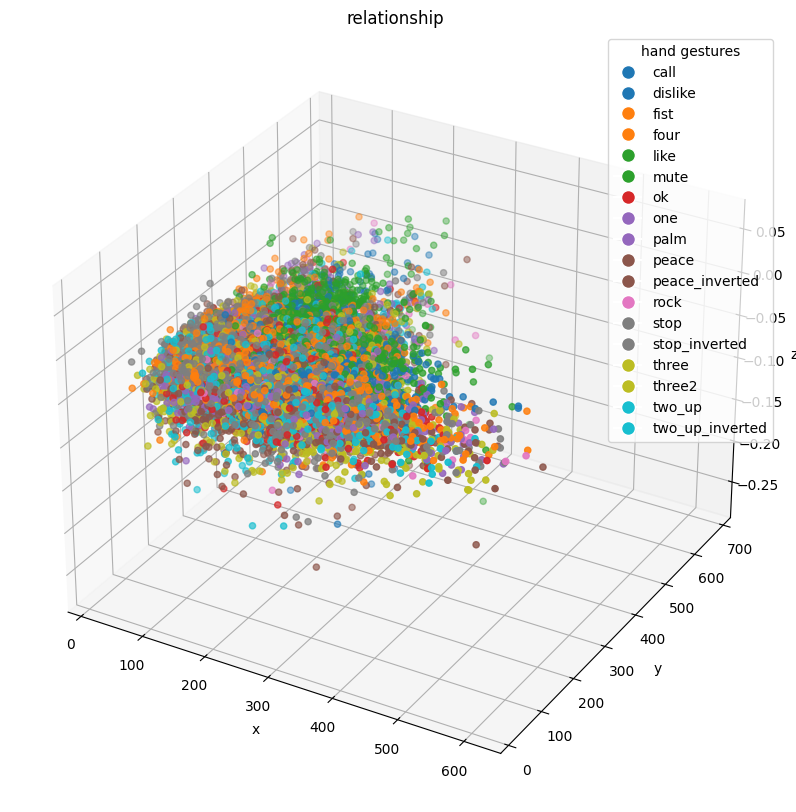

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


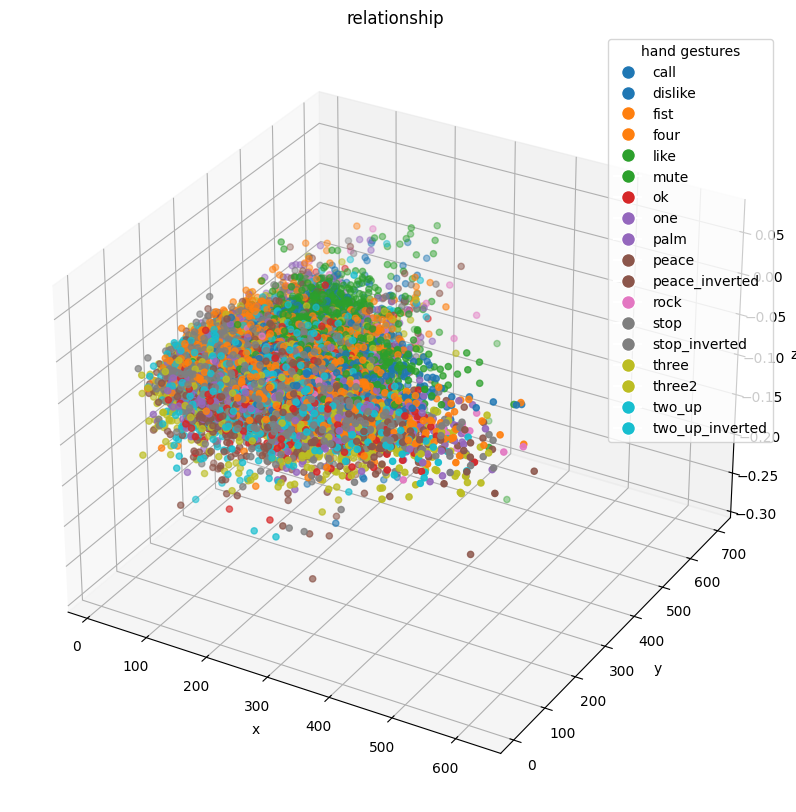

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


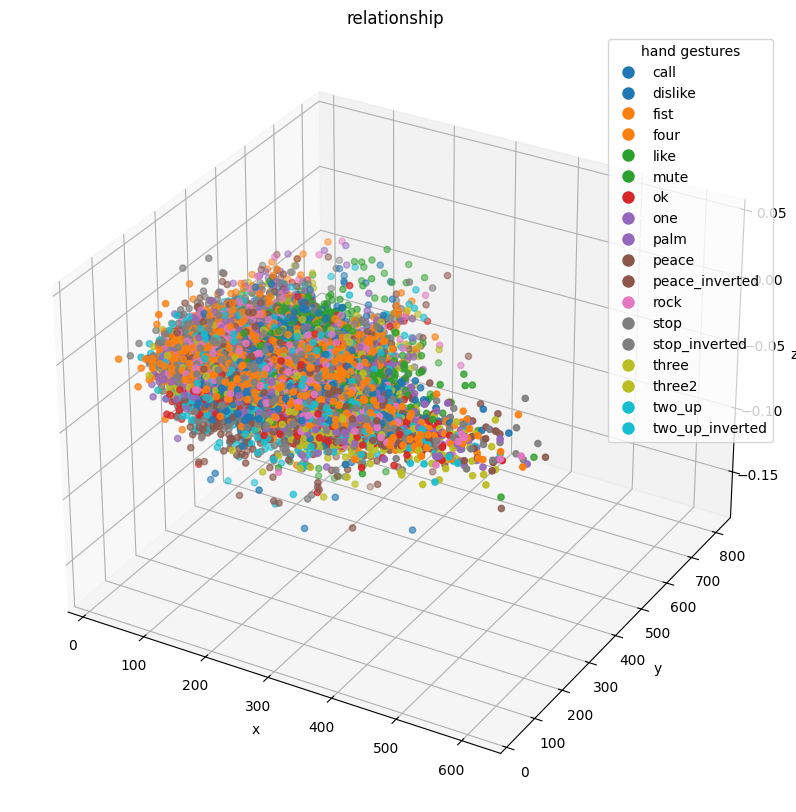

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


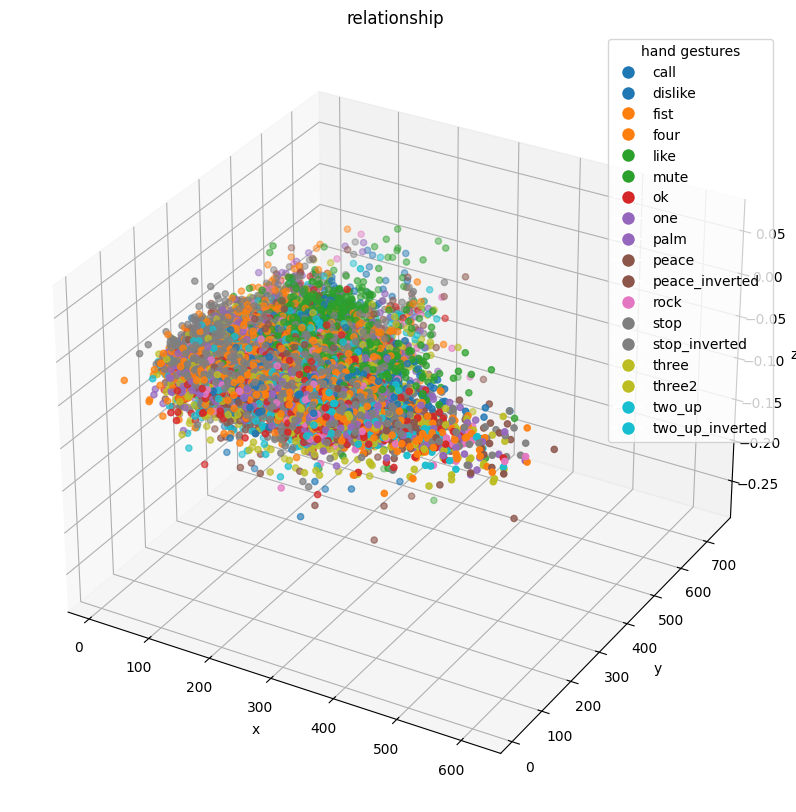

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


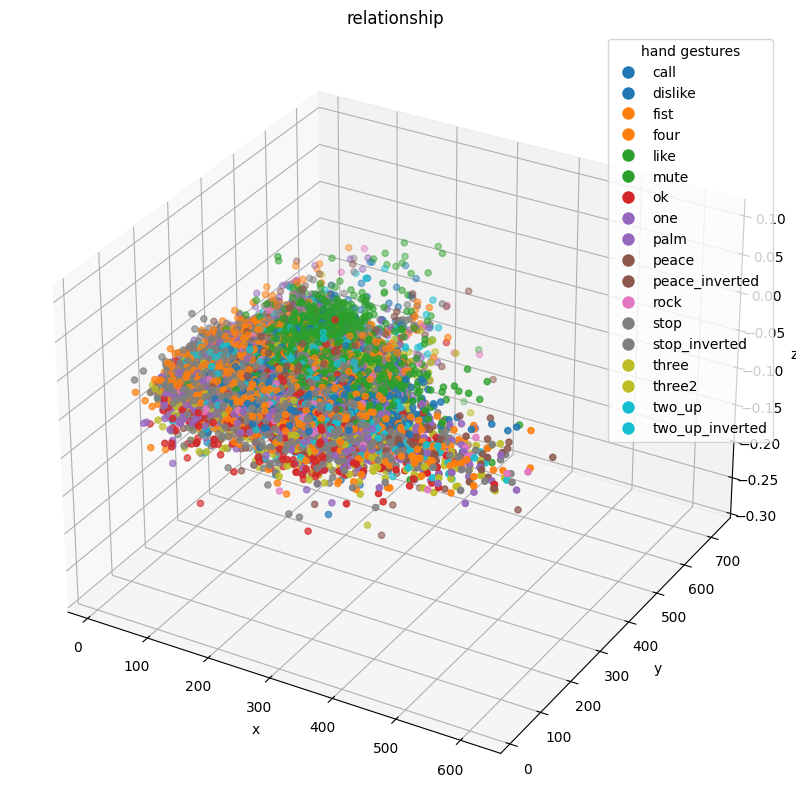

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


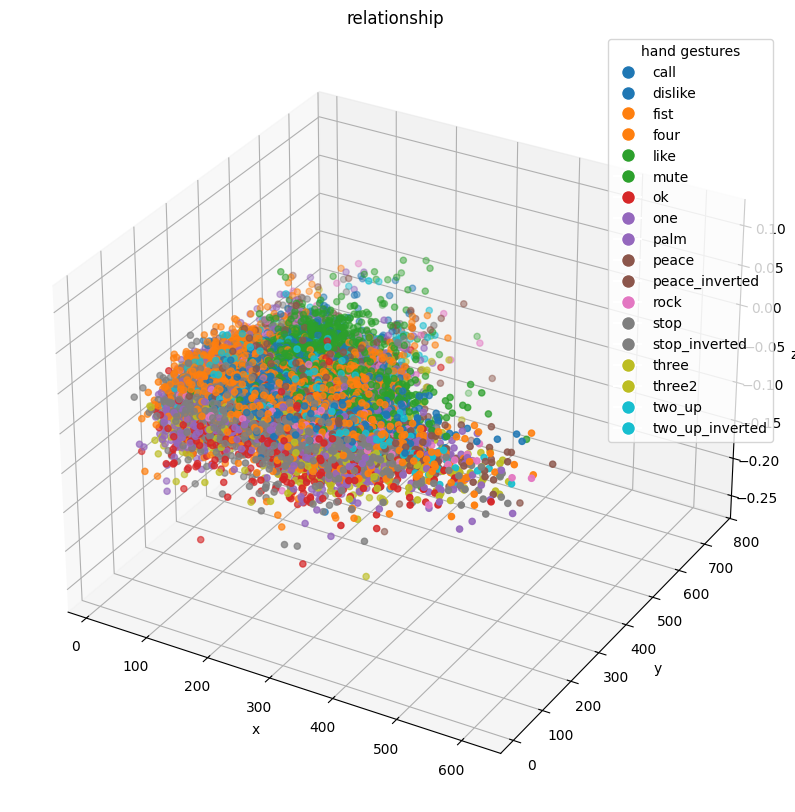

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


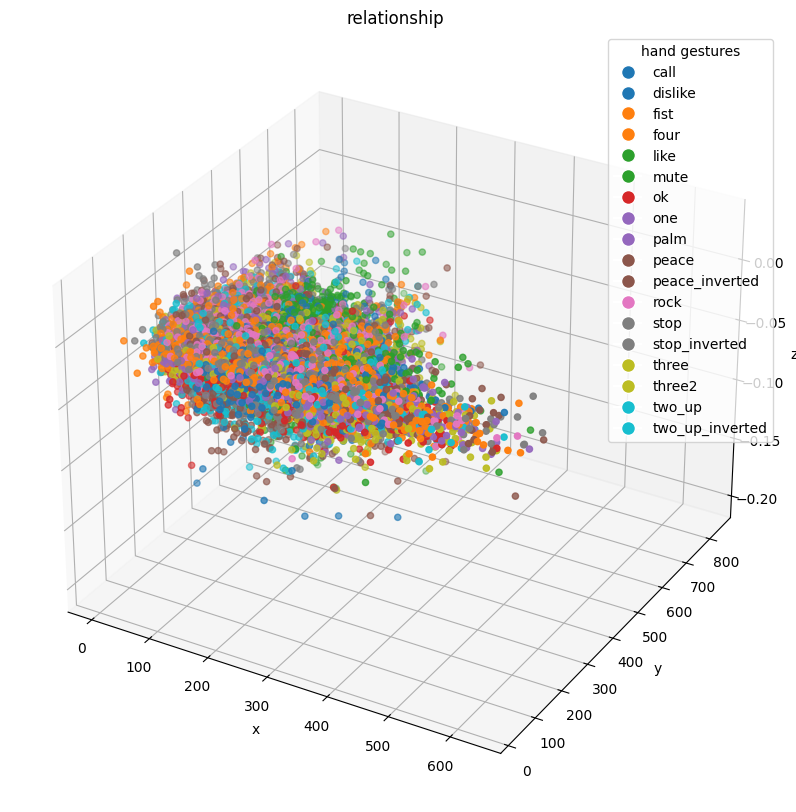

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


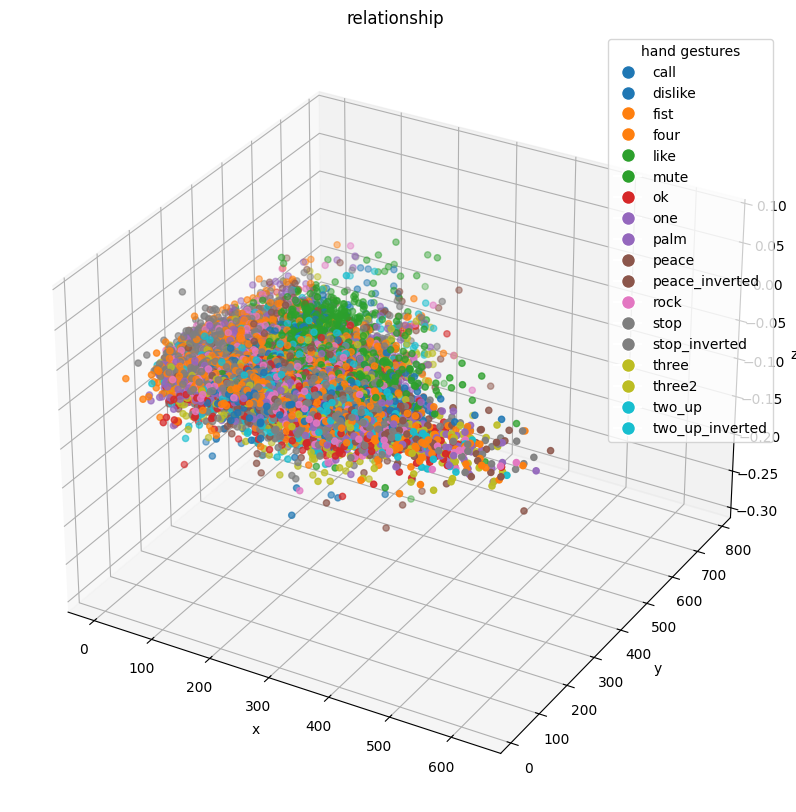

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


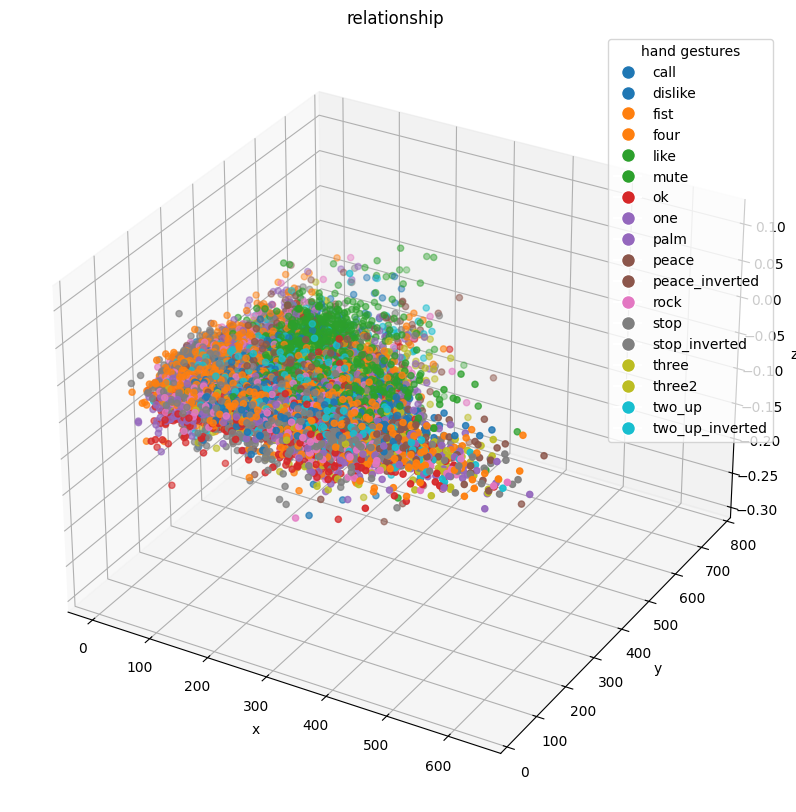

<ipython-input-12-ad441f93537f>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap=cm.get_cmap('tab10',len(data['label'].unique()))


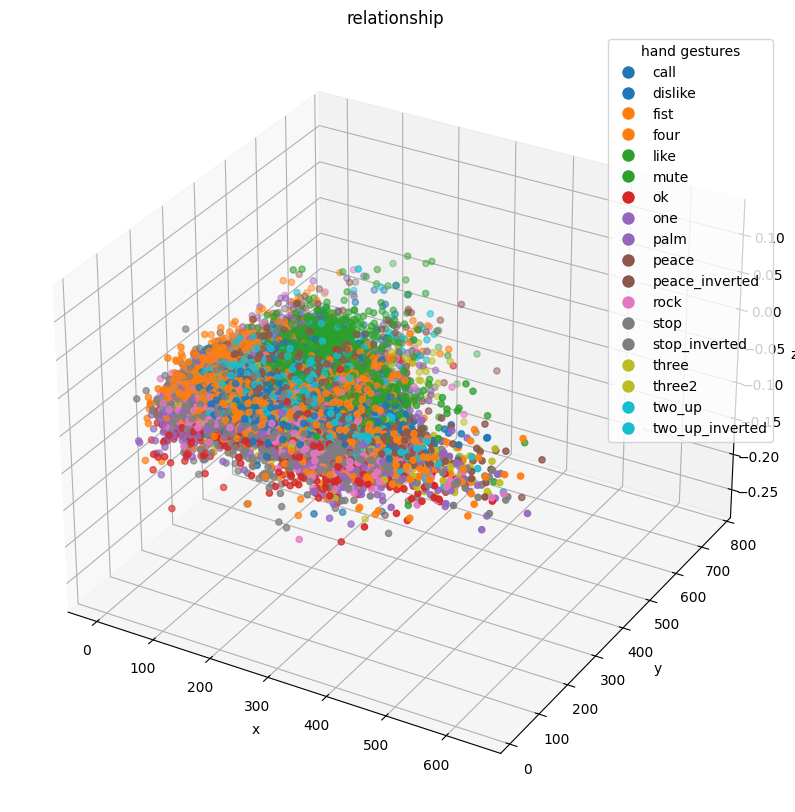

In [13]:
#multivarite
# these graphs show relationship bettween x,y,z for each key point with labels
for i in range(0,len(data.columns)-1,3):
  plot3D(data.iloc[:,i],data.iloc[:,i+1],data.iloc[:,i+2])

In [14]:
#divide data to X and Y
X=data.iloc[:,:63]
Y=data.iloc[:,-1]
X

,x1,y1,z1,x2,y2,z2,x3,y3,z3,x4,...,z18,x19,y19,z19,x20,y20,z20,x21,y21,z21
0,262.669968,257.304901,-3.649205e-07,257.417542,247.109055,0.004224,246.882957,241.716827,0.005798,236.384537,...,-0.013198,223.345093,255.490692,-0.020450,215.043365,258.114746,-0.024577,208.006393,259.608673,-0.026722
1,83.351778,346.059113,-2.345265e-07,81.925037,328.562347,-0.011102,90.080132,311.535248,-0.021096,95.641823,...,-0.029042,132.451618,341.794434,-0.038175,142.773582,342.829254,-0.037336,152.431698,343.015991,-0.036136
2,187.756977,260.235492,-2.417307e-07,195.460579,241.506035,-0.000184,207.259529,223.674339,-0.009687,215.413628,...,-0.041256,250.301010,268.602938,-0.044068,262.425133,271.276638,-0.040469,272.989952,272.272231,-0.038301
3,114.976696,331.594238,-1.233261e-07,114.503494,320.549957,-0.002824,116.636627,310.080994,-0.008911,117.685066,...,-0.021804,145.195450,329.357544,-0.027622,151.053200,329.712341,-0.027863,155.990364,329.548828,-0.027723
4,188.795288,141.727867,-1.622995e-07,188.520905,127.947464,-0.002884,191.982880,111.010563,-0.008115,192.552521,...,-0.021623,226.696396,132.263248,-0.025113,234.831741,130.684147,-0.024087,241.587769,128.477188,-0.023486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25670,259.135620,277.542236,4.323656e-07,271.098221,257.333374,0.007132,269.350250,237.538345,0.004480,257.334503,...,-0.033732,231.102150,230.308350,-0.028861,235.017242,235.029312,-0.016911,237.608711,240.918411,-0.006697
25671,90.063995,256.181732,3.808555e-07,77.302231,237.829132,0.003778,78.658888,220.471680,-0.001519,89.374163,...,-0.042692,116.692326,210.932007,-0.043690,112.681984,215.274353,-0.029510,110.178349,221.338379,-0.015630
25672,236.724518,251.496756,5.912488e-07,254.918358,232.369956,0.001354,256.002502,209.969106,-0.001674,247.075447,...,-0.033021,211.933777,202.389975,-0.031740,215.493393,208.953272,-0.021970,218.057648,215.236920,-0.010803
25673,119.466957,309.842529,4.319564e-07,111.772064,291.310333,0.006174,116.895447,273.683929,0.001893,129.239788,...,-0.044705,157.217422,271.056702,-0.046297,154.780106,277.261139,-0.032800,150.117119,282.011047,-0.020277


In [15]:
Y

,label
0,call
1,call
2,call
3,call
4,call
...,...
25670,two_up_inverted
25671,two_up_inverted
25672,two_up_inverted
25673,two_up_inverted


In [16]:
def recenter_landmarks(landmarks):
  landmarks=landmarks.copy()
  wrist_x, wrist_y = landmarks.iloc[:,0], landmarks.iloc[:,1]
  # Subtract wrist coordinates from all landmarks
  for i in range(21):  # 21 landmarks
      landmarks.iloc[:,i * 3] -= wrist_x
      landmarks.iloc[:,i * 3 + 1] -= wrist_y

  return landmarks

In [17]:
def normalize_landmarks(landmarks):
    mid_finger_x, mid_finger_y = landmarks.iloc[:,9 * 3], landmarks.iloc[:,9 * 3 + 1]
    norm=np.sqrt(mid_finger_x**2,mid_finger_y**2)
    # Prevent division by zero
    norm[norm==0]=1
    # Normalize landmarks
    for i in range(21):  # 21 landmarks
        landmarks.iloc[:,i * 3] /= norm
        landmarks.iloc[:,i * 3 + 1] /= norm
    return landmarks


In [18]:
# split data into train,validation,test
X_train,Xvaltest,y_train,y_valtest=train_test_split(X,Y,test_size=0.4,random_state=42,stratify=Y)
X_val,X_test,y_val,y_test=train_test_split(Xvaltest,y_valtest,test_size=0.5,random_state=42,stratify=y_valtest)

In [19]:
# apply preprocessing on data
X_train=recenter_landmarks(X_train)
X_val=recenter_landmarks(X_val)
X_test=recenter_landmarks(X_test)

In [20]:
X_train=normalize_landmarks(X_train)
X_val=normalize_landmarks(X_val)
X_test=normalize_landmarks(X_test)

In [21]:
encoder=LabelEncoder()
y_train=encoder.fit_transform(y_train)
y_val=encoder.transform(y_val)
y_test=encoder.transform(y_test)

In [22]:
classes=encoder.classes_

In [23]:
classes

array(['call', 'dislike', 'fist', 'four', 'like', 'mute', 'ok', 'one',
       'palm', 'peace', 'peace_inverted', 'rock', 'stop', 'stop_inverted',
       'three', 'three2', 'two_up', 'two_up_inverted'], dtype=object)

In [24]:
scaling=RobustScaler()
X_train=scaling.fit_transform(X_train)
X_val=scaling.transform(X_val)
X_test=scaling.transform(X_test)

In [25]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))
print(len(X_val))
print(len(y_val))

15405
15405
5135
5135
5135
5135


In [26]:
#evaluation
def evaluation(y_test,y_pred):
    print('Accuracy:%.2f'% accuracy_score(y_test,y_pred))
    conf=confusion_matrix(y_test,y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=conf,display_labels=classes)
    disp.plot(cmap="Blues")
    plt.xticks(rotation=90, ha="right")
    plt.title("Confusion Matrix")
    plt.show()
    print('Precision: %.3f' % precision_score(y_test,y_pred,average='weighted'))
    print('Recall: %.3f' % recall_score(y_test,y_pred,average='weighted'))
    print('f1_score: %.3f' % f1_score(y_test,y_pred,average='weighted'))

In [ ]:
#model training
gbc = GradientBoostingClassifier(random_state=42)
param_grid_gbc = {
'n_estimators': [200],
'learning_rate': [0.01, 0.05, 0.1],
}
model_gb= GridSearchCV(gbc, param_grid_gbc,scoring='accuracy',verbose=2,n_jobs=-1)
model_gb.fit(X_train,y_train)

In [ ]:
y_pred1=model_gb.predict(X_val)

In [ ]:
joblib.dump(model_gb,"pkl_files/GredientBoostingClassifier.pkl")

In [ ]:
evaluation(y_val,y_pred1)

In [ ]:
rfc=RandomForestClassifier(random_state=42)
param_grid_rfc = {
'n_estimators': [100, 200, 300],
'max_depth': [10, 20, 30],
'max_features': ['sqrt', 'log2'],
'class_weight': [None, 'balanced']
}
model_rf= GridSearchCV(rfc, param_grid_rfc,scoring='accuracy',verbose=2)
model_rf.fit(X_train,y_train)
y_pred2=model_rf.predict(X_val)

In [ ]:
joblib.dump(model_rf,"pkl_files/RandomForestClassifier.pkl")

In [ ]:
evaluation(y_val,y_pred2)

In [33]:
param_grid={
    'C': [0.1,1, 10, 100],
    'gamma': ['scale', 0.001, 0.01, 0.1, 1],
    'kernel': ['rbf', 'poly']
}

In [34]:
grid_search = GridSearchCV(
    SVC(),
    param_grid,
    cv=5,
    scoring='accuracy',
    verbose=2,

)

In [35]:
grid_search.fit(X_train,y_train)
print("Best Parameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV] END .....................C=0.1, gamma=scale, kernel=rbf; total time=  20.7s
[CV] END .....................C=0.1, gamma=scale, kernel=rbf; total time=  21.5s
[CV] END .....................C=0.1, gamma=scale, kernel=rbf; total time=  20.7s
[CV] END .....................C=0.1, gamma=scale, kernel=rbf; total time=  21.5s
[CV] END .....................C=0.1, gamma=scale, kernel=rbf; total time=  21.8s
[CV] END ....................C=0.1, gamma=scale, kernel=poly; total time=  21.0s
[CV] END ....................C=0.1, gamma=scale, kernel=poly; total time=  23.1s
[CV] END ....................C=0.1, gamma=scale, kernel=poly; total time=  21.2s
[CV] END ....................C=0.1, gamma=scale, kernel=poly; total time=  20.4s
[CV] END ....................C=0.1, gamma=scale, kernel=poly; total time=  22.1s
[CV] END .....................C=0.1, gamma=0.001, kernel=rbf; total time=  31.8s
[CV] END .....................C=0.1, gamma=0.00

In [37]:
joblib.dump(grid_search,"SVMClassifier.pkl")

['SVMClassifier.pkl']

In [38]:
model3=grid_search.best_estimator_
y_pred3=model3.predict(X_val)


Accuracy:0.98


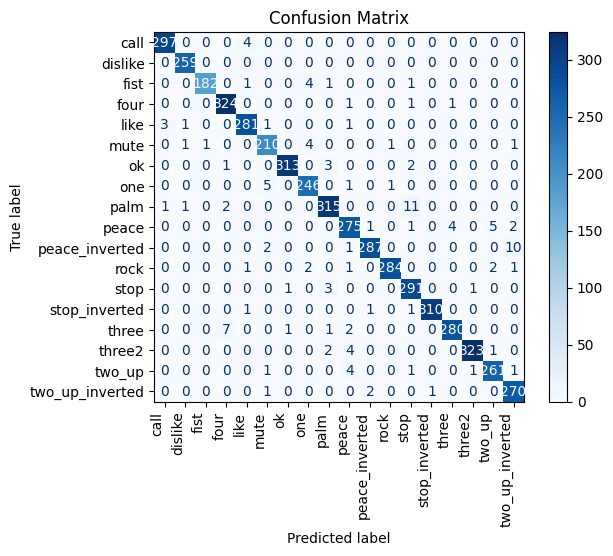

Precision: 0.976
Recall: 0.975
f1_score: 0.975


In [39]:
evaluation(y_val,y_pred3)

Accuracy:0.98


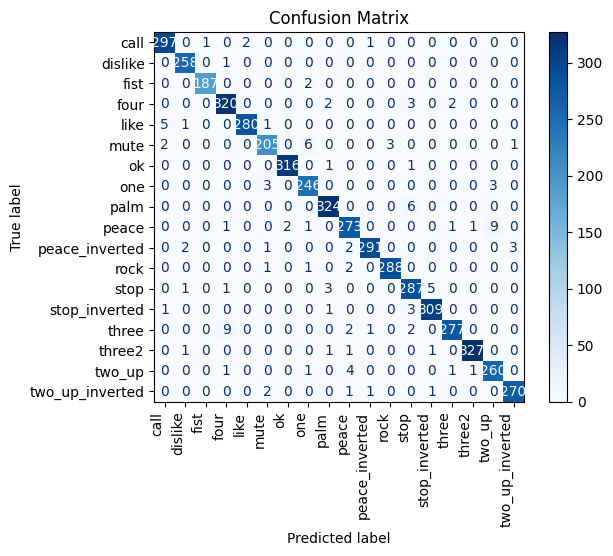

Precision: 0.977
Recall: 0.977
f1_score: 0.977


In [40]:
# after training and validation we choose model3(SVM)
result=model3.predict(X_test)
evaluation(y_test,result)

In [42]:
joblib.dump(scaling, "scaling.pkl")
print("Scaler saved successfully!")

Scaler saved successfully!


In [43]:
model = joblib.load("SVMClassifier.pkl")
print("Model loaded successfully!")

Model loaded successfully!


In [44]:
scaling = joblib.load("scaling.pkl")
print("Scaler loaded successfully!")

Scaler loaded successfully!


In [45]:
gesture_labels = {
    0: "call", 1: "dislike", 2: "fist", 3: "four", 4: "like",
    5: "mute", 6: "ok", 7: "one", 8: "palm", 9: "peace",
    10: "peace inv.", 11: "rock", 12: "stop", 13: "stop inv.",
    14: "three", 15: "three 2", 16: "two up", 17: "two up inv."
}

In [ ]:
# Initialize MediaPipe Hand Model
mp_hands = mp.solutions.hands
mp_drawing = mp.solutions.drawing_utils
hands = mp_hands.Hands(static_image_mode=False, max_num_hands=1, min_detection_confidence=0.5)

In [47]:

# Open the input video
cap = cv2.VideoCapture("/content/inputSample.mp4")

# Define output video parameters
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter("outputSample1.avi", fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

# Process each frame
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Convert to RGB for MediaPipe
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    result = hands.process(rgb_frame)

    if result.multi_hand_landmarks:
        for hand_landmarks in result.multi_hand_landmarks:
            # Draw landmarks on frame
            mp_drawing.draw_landmarks(frame, hand_landmarks, mp_hands.HAND_CONNECTIONS)

            # Extract landmark (x, y, z) positions
            landmarks = []
            for lm in hand_landmarks.landmark:
                landmarks.extend([lm.x, lm.y, lm.z])

            # Convert to NumPy array and reshape
            landmarks = np.array(landmarks).reshape(1, -1)

            # apply preprocessing step
            feature_names = [f"{axis}{i+1}" for i in range(21) for axis in ["x", "y", "z"]]
            landmarks_df = pd.DataFrame(landmarks, columns=feature_names)
            landmarks_df = recenter_landmarks(landmarks_df)
            landmarks_df = normalize_landmarks(landmarks_df)
            landmarks_scaled = scaling.transform(landmarks_df)

            # Predict the gesture
            prediction = model.predict(landmarks_scaled)[0]
            gesture_name = gesture_labels.get(int(prediction), "Unknown")

            # Display the predicted gesture on the frame
            cv2.putText(frame,gesture_name, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)


    # Save frame to output video
    out.write(frame)

    # Press 'q' to exit early
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

# Release resources
cap.release()
out.release()
cv2.destroyAllWindows()